In [96]:
pip install lime

In [97]:
import pandas as pd
df = pd.read_csv("/content/Ambari_new.csv")
df.head()

,title,description,label
0,Add additional transition states,For running a server (daemon) the current sta...,0
1,Preserve cluster id blueprint name and bluep...,After agent execute commands on behave of the ...,0
2,Agent should retry heartbeat message if contr...,If the heartbeat was not received correctly by...,0
3,Remove agent entities beans from public schema...,Agent entities beans are located ambari-client...,0
4,Check for NN safemode during restarts,There is no checks for safemode when we reconf...,0


In [98]:
# Data Analysis
import pandas as pd
import numpy as np

# Data Visualization
from matplotlib import pyplot as plt
import seaborn as sns

# Machine Learning
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score,auc, precision_score, recall_score, roc_auc_score, roc_curve, confusion_matrix,f1_score
from imblearn.over_sampling import SMOTE
from sklearn.linear_model import LogisticRegression
from sklearn.naive_bayes import MultinomialNB
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from xgboost import XGBClassifier

# NLP
from nltk.tokenize import word_tokenize
from nltk.corpus import stopwords
from nltk.stem import PorterStemmer
from wordcloud import WordCloud, STOPWORDS
import re

# Warning
import warnings
warnings.filterwarnings('ignore')

Train and Test CSV files

In [99]:
import pandas as pd
from sklearn.model_selection import train_test_split

# Load your CSV file into a pandas DataFrame
data = pd.read_csv("/content/Ambari_new.csv")

# Split the data into features (X) and target variable (y) assuming the last column is the target variable
X = data.iloc[:, :-1]  # Features
y = data.iloc[:, -1]   # Target variable

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Concatenate features and target variable for training and testing sets
train_data = pd.concat([X_train, y_train], axis=1)
test_data = pd.concat([X_test, y_test], axis=1)

# Save the training and testing data to CSV files
train_data.to_csv("train.csv", index=False)
test_data.to_csv("test.csv", index=False)


In [100]:
# Loading train data
train_df = pd.read_csv('/content/train.csv')
print(f'Train data shape: {train_df.shape}')
train_df.head()

Train data shape: (800, 3)


,title,description,label
0,Fixup review and deploy rendering,Currently render of the review and deploy page...,0
1,'Services' 'Dashboard' 'Navigation errors,Navigation from Hosts to Services page or from...,0
2,Move 1.3.4 stack to 1.3.3 using the python lib...,Move 1.3.4 stack to 1.3.3 using the pythin lib...,0
3,Hbase secure config properties in HDP-2.x stac...,Hbase secure config properties in HDP-2.x stac...,0
4,Restart option is enabled for components in 'D...,'Restart' option should not be enabled if a sl...,0


In [101]:
# Loading test data
test_df = pd.read_csv('/content/test.csv')
print(f'Test data shape: {test_df.shape}')
test_df.head()

Test data shape: (200, 3)


,title,description,label
0,Strange behavior of 'JobTracker CPU WIO' dashb...,This happened because when fixing an old issue...,0
1,The user is not always redirected to the login...,1. Try to enable HA with fail on 9th step for ...,0
2,Install Wizard: Assign Masters: some selects d...,Step to reproduce.Go untill to Customize Servi...,0
3,Need tooltip showing error why local repo is bad,I selected HDP 2.0.8 stack and Centos5 base-ur...,0
4,Update Ember-I18n,Update Ember-I18n,0


In [102]:
# Duplicates check
train_df.duplicated().sum()

1

In [103]:
# Data types check
train_df.dtypes

title          object
description    object
label           int64
dtype: object

In [104]:
# Missing values check
print(f'Missing values in train data:\n{train_df.isnull().sum()}')
print('-'*40)
print(f'Missing values in test data:\n{test_df.isnull().sum()}')

Missing values in train data:
title          0
description    0
label          0
dtype: int64
----------------------------------------
Missing values in test data:
title          0
description    0
label          0
dtype: int64


In [105]:
import pandas as pd

# Assuming you have already loaded your train and test DataFrames as train_df and test_df

# Remove missing values from the train DataFrame
train_df = train_df.dropna()

# Remove missing values from the test DataFrame
test_df = test_df.dropna()

# Check if missing values are removed
print(f'Missing values in train data after removal:\n{train_df.isnull().sum()}')
print('-'*40)
print(f'Missing values in test data after removal:\n{test_df.isnull().sum()}')

Missing values in train data after removal:
title          0
description    0
label          0
dtype: int64
----------------------------------------
Missing values in test data after removal:
title          0
description    0
label          0
dtype: int64


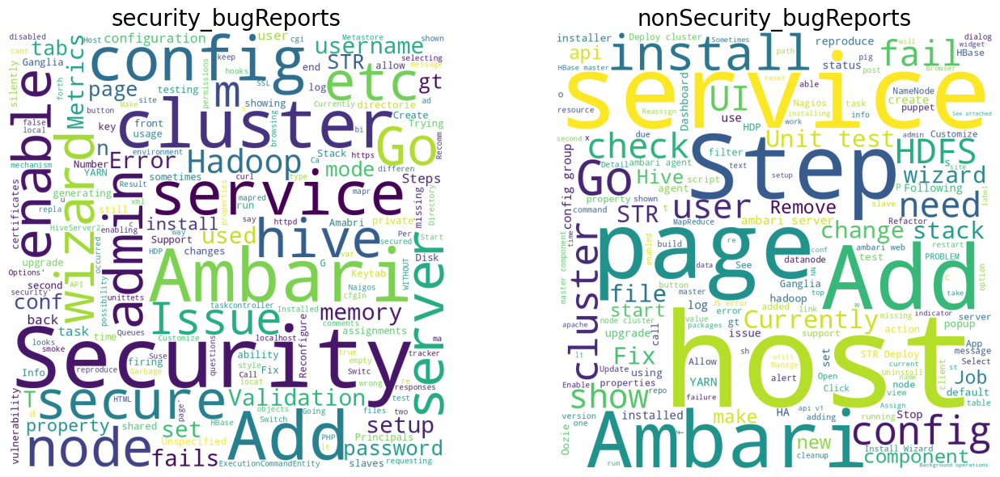

In [106]:
# Plotting wordclouds
stopwords = set(STOPWORDS)

security_bugReports = train_df['description'][train_df['label']==1].to_string()
wordcloud_negative = WordCloud(width = 800, height = 800,
                               background_color ='white', stopwords = stopwords,
                               min_font_size = 10).generate(security_bugReports)

nonSecurity_bugReports = train_df['description'][train_df['label']==0].to_string()
wordcloud_positive = WordCloud(width = 800, height = 800,
                               background_color ='white', stopwords = stopwords,
                               min_font_size = 10).generate(nonSecurity_bugReports)

# Plotting the WordCloud images
plt.figure(figsize=(14, 6), facecolor = None)

plt.subplot(1, 2, 1)
plt.imshow(wordcloud_negative)
plt.axis("off")
plt.title('security_bugReports', fontdict={'fontsize': 20})

plt.subplot(1, 2, 2)
plt.imshow(wordcloud_positive)
plt.axis("off")
plt.title('nonSecurity_bugReports', fontdict={'fontsize': 20})

plt.tight_layout()
plt.show()

Data Preprocessing

In [107]:
# Train-Test Splitting
X = train_df.drop(columns=['label'])
y = train_df['label']
test = test_df
print(X.shape, test.shape, y.shape)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=10)
print(X_train.shape, X_test.shape, y_train.shape, y_test.shape)

(800, 2) (200, 3) (800,)
(640, 2) (160, 2) (640,) (160,)


In [108]:
X_train.dtypes

title          object
description    object
dtype: object

Text Normalization

In [109]:
# Function to tokenize and clean the text
def tokenize_and_clean(text):
    # Changing case of the text to lower case
    lowered = text.lower()

    # Cleaning the text
    cleaned = re.sub('@user', '', lowered)

    # Tokenization
    tokens = word_tokenize(cleaned)
    filtered_tokens = [token for token in tokens if re.match(r'\w{1,}', token)]

    # Stemming
    stemmer = PorterStemmer()
    stems = [stemmer.stem(token) for token in filtered_tokens]
    return stems

**Vectorization**

In [110]:
import nltk
nltk.download('punkt')

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


True

In [111]:
# BOW Vectorization

# TF-IDF Vectorization
tfidf_vectorizer = TfidfVectorizer(tokenizer=tokenize_and_clean, stop_words='english')
X_train_tfidf = tfidf_vectorizer.fit_transform(X_train['description'])
X_test_tfidf = tfidf_vectorizer.transform(X_test['description'])
print(X_train_tfidf.shape, X_test_tfidf.shape)

# TF-IDF Vectorization on full training data
tfidf_vectorizer_full = TfidfVectorizer(tokenizer=tokenize_and_clean, stop_words='english')
X_tfidf = tfidf_vectorizer_full.fit_transform(X['description'])
test_tfidf = tfidf_vectorizer_full.transform(test['description'])
print(X_tfidf.shape, test_tfidf.shape)

(640, 3931) (160, 3931)
(800, 4549) (200, 4549)


**SMOTE**

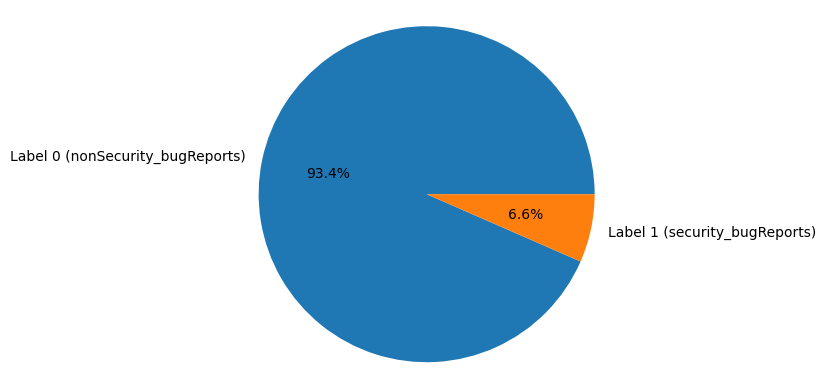

In [112]:
# Class Imbalance Check
plt.pie(y_train.value_counts(),
        labels=['Label 0 (nonSecurity_bugReports)', 'Label 1 (security_bugReports)'],
        autopct='%0.1f%%')
plt.axis('equal')
plt.show()

(1196, 3931) (1196,)
(1504, 4549) (1504,)


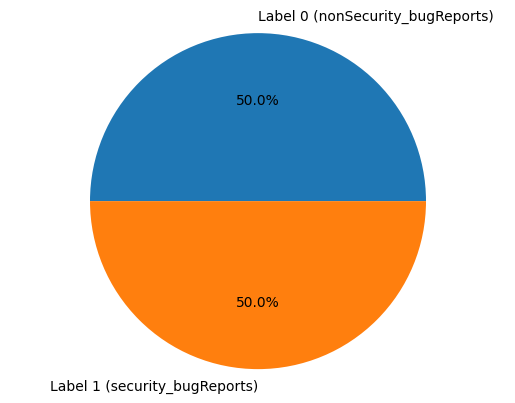

In [113]:
# SMOTE to deal with the class imbalance
smote = SMOTE()
X_train_smote, y_train_smote = smote.fit_resample(X_train_tfidf, y_train.values)
print(X_train_smote.shape, y_train_smote.shape)

# SMOTE on full training data
smote = SMOTE()
X_smote, y_smote = smote.fit_resample(X_tfidf, y.values)
print(X_smote.shape, y_smote.shape)

# Class Imbalance Check
plt.pie(pd.value_counts(y_train_smote),
        labels=['Label 0 (nonSecurity_bugReports)', 'Label 1 (security_bugReports)'],
        autopct='%0.1f%%')
plt.axis('equal')
plt.show()

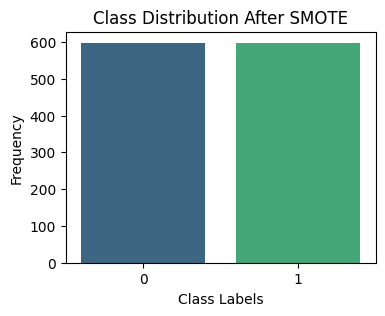

In [114]:

# Class Imbalance Check using bar plot
class_counts = pd.value_counts(y_train_smote)

plt.figure(figsize=(4, 3))
sns.barplot(x=class_counts.index, y=class_counts.values, palette='viridis')
plt.title('Class Distribution After SMOTE')
plt.xlabel('Class Labels')
plt.ylabel('Frequency')
plt.xticks(ticks=[0, 1], labels=['0', '1'])
plt.savefig('imb_mege.png', bbox_inches='tight')
plt.show()

ML **Modeling**

In [115]:
# Functions to print scores
def training_scores(y_act, y_pred):
    acc = round(accuracy_score(y_act, y_pred), 3)
    precision = round(precision_score(y_act, y_pred), 3)
    recall = round(recall_score(y_act, y_pred), 3)
    f1 = round(f1_score(y_act, y_pred), 3)
    roc_auc = round(roc_auc_score(y_act, y_pred), 3)
    print(f'Training Scores: Accuracy={acc}, precision={precision}, recall={recall}, F1-Score={f1}, roc={roc_auc}')

def validation_scores(y_act, y_pred):
    acc = round(accuracy_score(y_act, y_pred), 3)
    precision = round(precision_score(y_act, y_pred), 3)
    recall = round(recall_score(y_act, y_pred), 3)
    f1 = round(f1_score(y_act, y_pred), 3)
    roc_auc = round(roc_auc_score(y_act, y_pred), 3)
    print(f'Validation Scores: Accuracy={acc}, precision={precision}, recall={recall}, F1-Score={f1}, roc={roc_auc}')

In [116]:
# Logistic Regression
lr = LogisticRegression()
lr.fit(X_train_smote, y_train_smote)
y_train_pred = lr.predict(X_train_smote)
y_test_pred = lr.predict(X_test_tfidf)
training_scores(y_train_smote, y_train_pred)
validation_scores(y_test, y_test_pred)

Training Scores: Accuracy=0.992, precision=0.985, recall=1.0, F1-Score=0.993, roc=0.992
Validation Scores: Accuracy=0.956, precision=0.429, recall=0.5, F1-Score=0.462, roc=0.737


In [117]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, roc_auc_score, roc_curve, confusion_matrix

precision = precision_score(y_test, y_test_pred)
recall = recall_score(y_test, y_test_pred)
roc_auc = roc_auc_score(y_test, y_test_pred)
f1score = f1_score(y_test,y_test_pred)
fpr, tpr, thresholds = roc_curve(y_test, y_test_pred)

print("Precision:", precision)
print("Recall:", recall)
print("ROC AUC:", roc_auc)
print("F1 Score:", f1score)

Precision: 0.42857142857142855
Recall: 0.5
ROC AUC: 0.737012987012987
F1 Score: 0.4615384615384615


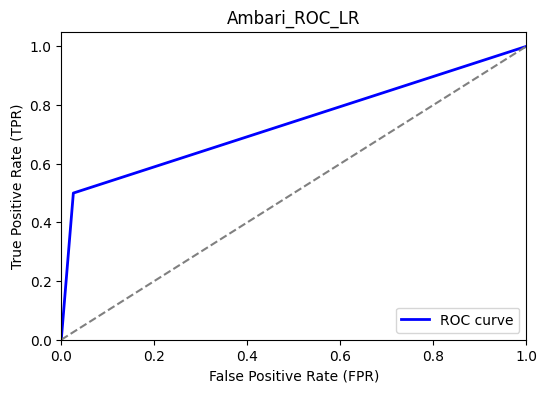

In [118]:
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve

# Compute ROC curve
fpr, tpr, thresholds = roc_curve(y_test, y_test_pred)

# Plot ROC curve
plt.figure(figsize=(6, 4))  # Set the figure size to be smaller
plt.plot(fpr, tpr, color='blue', lw=2, label='ROC curve')
plt.plot([0, 1], [0, 1], color='gray', linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate (FPR)')
plt.ylabel('True Positive Rate (TPR)')
plt.title('Ambari_ROC_LR')
plt.legend(loc='lower right')

# Save the plot with a smaller image size
plt.savefig('Ambari_ROC_LR.png', bbox_inches='tight')  # Adjust dpi for desired image size
plt.show()

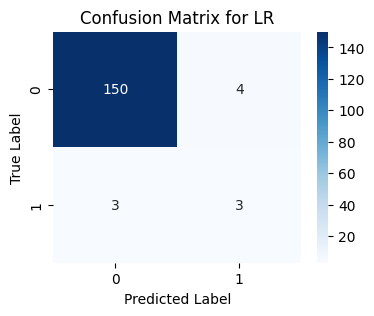

In [119]:
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import accuracy_score, precision_score, recall_score, roc_auc_score, roc_curve, confusion_matrix

# Calculate the confusion matrix
conf_matrix = confusion_matrix(y_test, y_test_pred)

# Plot the confusion matrix
plt.figure(figsize=(4, 3))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues')
plt.title('Confusion Matrix for LR')
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.savefig('confusion_matrix_lr.png', bbox_inches='tight')

plt.show()

--------------------------**LIME for Logistic Regression**----------------------

In [120]:
from lime.lime_text import LimeTextExplainer
class_names = list(train_df.label.unique())
explainer = LimeTextExplainer(class_names=class_names)

In [121]:
max_features = train_df.description.str.split().map(lambda x: len(x)).max()
print(max_features)

2710


In [122]:
from sklearn.pipeline import make_pipeline
pipe = make_pipeline(tfidf_vectorizer, lr)

In [123]:
import random

random.seed(21)
idx = random.randint(0, len(test))
print(idx)

exp = explainer.explain_instance(
    test.title.iloc[idx], pipe.predict_proba, num_features=5
)

42


In [124]:
print(
    f"Probability of sample to be non_security is: {pipe.predict_proba([test.title.iloc[idx]])}\n"
)
print(f"Explanation as a list of weighted features")
exp.as_list()

Probability of sample to be non_security is: [[0.79742196 0.20257804]]

Explanation as a list of weighted features


[('start', -0.029801027763756385),
 ('master', 0.017908686707903767),
 ('fails', 0.012745348790705767),
 ('HBASE', 0.0070717509160681145),
 ('to', 0.00018109180584893313)]

In [125]:
[test.title.iloc[idx]]

['HBASE fails to start on master']

In [126]:
exp.show_in_notebook(text=True)

**-------MNB=------**

In [127]:
# Naive Bayes Classifier
mnb = MultinomialNB()
mnb.fit(X_train_smote, y_train_smote)
y_train_pred = mnb.predict(X_train_smote)
y_test_pred = mnb.predict(X_test_tfidf)
training_scores(y_train_smote, y_train_pred)
validation_scores(y_test, y_test_pred)

Training Scores: Accuracy=0.972, precision=0.946, recall=1.0, F1-Score=0.972, roc=0.972
Validation Scores: Accuracy=0.844, precision=0.12, recall=0.5, F1-Score=0.194, roc=0.679


In [128]:
precision = precision_score(y_test, y_test_pred)
recall = recall_score(y_test, y_test_pred)
roc_auc = roc_auc_score(y_test, y_test_pred)
f1score = f1_score(y_test,y_test_pred)
fpr, tpr, thresholds = roc_curve(y_test, y_test_pred)

print("Precision:", precision)
print("Recall:", recall)
print("ROC AUC:", roc_auc)
print("F1 Score:", f1score)

Precision: 0.12
Recall: 0.5
ROC AUC: 0.6785714285714286
F1 Score: 0.1935483870967742


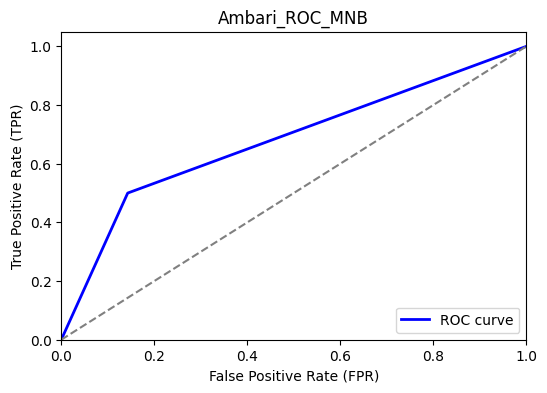

In [129]:
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve

# Compute ROC curve
fpr, tpr, thresholds = roc_curve(y_test, y_test_pred)

# Plot ROC curve
plt.figure(figsize=(6, 4))  # Set the figure size to be smaller
plt.plot(fpr, tpr, color='blue', lw=2, label='ROC curve')
plt.plot([0, 1], [0, 1], color='gray', linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate (FPR)')
plt.ylabel('True Positive Rate (TPR)')
plt.title('Ambari_ROC_MNB')
plt.legend(loc='lower right')

# Save the plot with a smaller image size
plt.savefig('Ambari_ROC_mnb.png', bbox_inches='tight')  # Adjust dpi for desired image size
plt.show()

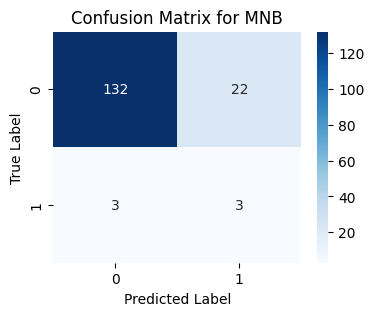

In [130]:
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import accuracy_score, precision_score, recall_score, roc_auc_score, roc_curve, confusion_matrix

# Calculate the confusion matrix
conf_matrix = confusion_matrix(y_test, y_test_pred)

# Plot the confusion matrix
plt.figure(figsize=(4, 3))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues')
plt.title('Confusion Matrix for MNB')
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.savefig('confusion_matrix_mnb.png', bbox_inches='tight')

plt.show()

--------------------------**LIME for Naive Bayes**----------------------

In [131]:
from lime.lime_text import LimeTextExplainer
class_names = list(train_df.label.unique())
explainer = LimeTextExplainer(class_names=class_names)

In [132]:
max_features = train_df.description.str.split().map(lambda x: len(x)).max()
print(max_features)

2710


In [133]:
from sklearn.pipeline import make_pipeline
pipe = make_pipeline(tfidf_vectorizer, mnb)

In [134]:
import random

random.seed(21)
idx = random.randint(0, len(test))
print(idx)

exp = explainer.explain_instance(
    test.title.iloc[idx], pipe.predict_proba, num_features=5
)

42


In [135]:
print(
    f"Probability of sample to be non_security is: {pipe.predict_proba([test.title.iloc[idx]])}\n"
)
print(f"Explanation as a list of weighted features")
exp.as_list()

Probability of sample to be non_security is: [[0.46546216 0.53453784]]

Explanation as a list of weighted features


[('HBASE', 0.12741344695924786),
 ('master', -0.0838511217515536),
 ('start', -0.03217868919261246),
 ('fails', 0.020964939204398042),
 ('on', 0.000103460057237926)]

In [136]:
[test.title.iloc[idx]]

['HBASE fails to start on master']

In [137]:
exp.show_in_notebook(text=True)

**==========RF=============**

In [138]:
# Random Forest Classifier
rf = RandomForestClassifier()
rf.fit(X_train_smote, y_train_smote)
y_train_pred = rf.predict(X_train_smote)
y_test_pred = rf.predict(X_test_tfidf)
training_scores(y_train_smote, y_train_pred)
validation_scores(y_test, y_test_pred)

Training Scores: Accuracy=1.0, precision=1.0, recall=1.0, F1-Score=1.0, roc=1.0
Validation Scores: Accuracy=0.962, precision=0.0, recall=0.0, F1-Score=0.0, roc=0.5


In [139]:
precision = precision_score(y_test, y_test_pred)
recall = recall_score(y_test, y_test_pred)
roc_auc = roc_auc_score(y_test, y_test_pred)
f1score = f1_score(y_test,y_test_pred)
fpr, tpr, thresholds = roc_curve(y_test, y_test_pred)

print("Precision:", precision)
print("Recall:", recall)
print("ROC AUC:", roc_auc)
print("F1 Score:", f1score)

Precision: 0.0
Recall: 0.0
ROC AUC: 0.5
F1 Score: 0.0


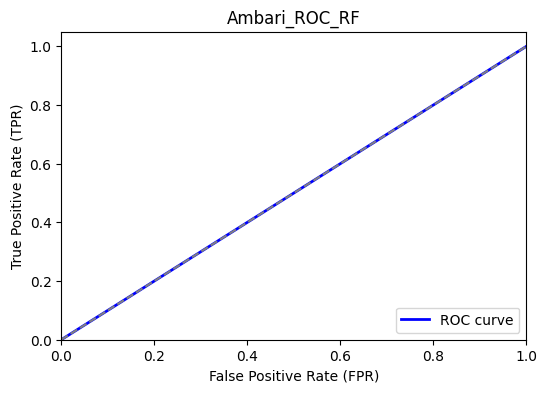

In [140]:
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve

# Compute ROC curve
fpr, tpr, thresholds = roc_curve(y_test, y_test_pred)

# Plot ROC curve
plt.figure(figsize=(6, 4))  # Set the figure size to be smaller
plt.plot(fpr, tpr, color='blue', lw=2, label='ROC curve')
plt.plot([0, 1], [0, 1], color='gray', linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate (FPR)')
plt.ylabel('True Positive Rate (TPR)')
plt.title('Ambari_ROC_RF')
plt.legend(loc='lower right')

# Save the plot with a smaller image size
plt.savefig('Ambari_ROC_RF.png', bbox_inches='tight')  # Adjust dpi for desired image size
plt.show()

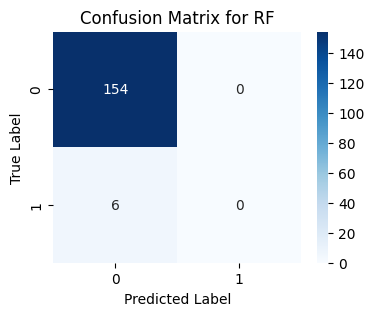

In [141]:
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import accuracy_score, precision_score, recall_score, roc_auc_score, roc_curve, confusion_matrix

# Calculate the confusion matrix
conf_matrix = confusion_matrix(y_test, y_test_pred)

# Plot the confusion matrix
plt.figure(figsize=(4, 3))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues')
plt.title('Confusion Matrix for RF')
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.savefig('confusion_matrix_rf.png', bbox_inches='tight')

plt.show()

----------------------**lime for Random Forest Classifier**---------------------

In [142]:
from sklearn.pipeline import make_pipeline
pipe = make_pipeline(tfidf_vectorizer, rf)

In [143]:
import random

random.seed(21)
idx = random.randint(0, len(test))
print(idx)

exp = explainer.explain_instance(
    test.title.iloc[idx], pipe.predict_proba, num_features=5
)

42


In [144]:
print(
    f"Probability of sample to be non_security is: {pipe.predict_proba([test.title.iloc[idx]])}\n"
)
print(f"Explanation as a list of weighted features")
exp.as_list()

Probability of sample to be non_security is: [[0.97 0.03]]

Explanation as a list of weighted features


[('master', 0.0335186616463349),
 ('fails', -0.0066127836911457905),
 ('on', 0.0003563791670704041),
 ('to', 0.00025139209957244547),
 ('start', 0.0002428931944576013)]

In [145]:
[test.title.iloc[idx]]

['HBASE fails to start on master']

In [146]:
exp.show_in_notebook(text=True)

**-------------XGB------------**

In [147]:
# Extreme Gradient Boosting Classifier
xgb = XGBClassifier(objective='binary:logistic', eval_metric='logloss')
xgb.fit(X_train_smote, y_train_smote)
y_train_pred = xgb.predict(X_train_smote)
y_test_pred = xgb.predict(X_test_tfidf)
training_scores(y_train_smote, y_train_pred)
validation_scores(y_test, y_test_pred)

Training Scores: Accuracy=0.998, precision=1.0, recall=0.997, F1-Score=0.998, roc=0.998
Validation Scores: Accuracy=0.956, precision=0.429, recall=0.5, F1-Score=0.462, roc=0.737


In [148]:
precision = precision_score(y_test, y_test_pred)
recall = recall_score(y_test, y_test_pred)
roc_auc = roc_auc_score(y_test, y_test_pred)
f1score = f1_score(y_test,y_test_pred)
fpr, tpr, thresholds = roc_curve(y_test, y_test_pred)

print("Precision:", precision)
print("Recall:", recall)
print("ROC AUC:", roc_auc)
print("F1 Score:", f1score)

Precision: 0.42857142857142855
Recall: 0.5
ROC AUC: 0.737012987012987
F1 Score: 0.4615384615384615


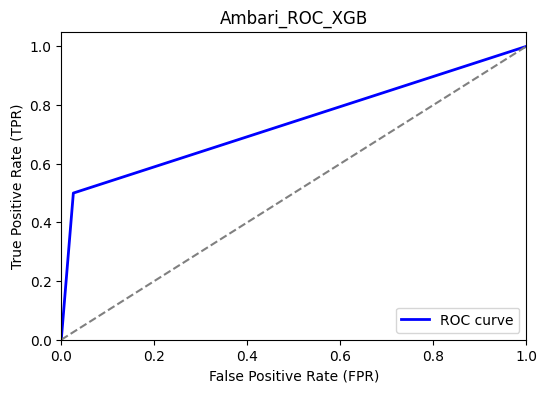

In [149]:
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve

# Compute ROC curve
fpr, tpr, thresholds = roc_curve(y_test, y_test_pred)

# Plot ROC curve
plt.figure(figsize=(6, 4))  # Set the figure size to be smaller
plt.plot(fpr, tpr, color='blue', lw=2, label='ROC curve')
plt.plot([0, 1], [0, 1], color='gray', linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate (FPR)')
plt.ylabel('True Positive Rate (TPR)')
plt.title('Ambari_ROC_XGB')
plt.legend(loc='lower right')

# Save the plot with a smaller image size
plt.savefig('Ambari_ROC_XGB.png', bbox_inches='tight')  # Adjust dpi for desired image size
plt.show()

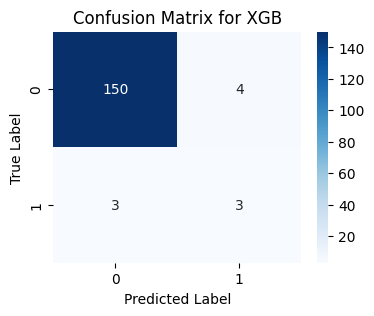

In [150]:
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import accuracy_score, precision_score, recall_score, roc_auc_score, roc_curve, confusion_matrix

# Calculate the confusion matrix
conf_matrix = confusion_matrix(y_test, y_test_pred)

# Plot the confusion matrix
plt.figure(figsize=(4, 3))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues')
plt.title('Confusion Matrix for XGB')
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.savefig('confusion_matrix_xgb.png', bbox_inches='tight')

plt.show()

---------------------**lime for Extreme Gradient Boosting**---------------------

In [151]:
from sklearn.pipeline import make_pipeline
pipe = make_pipeline(tfidf_vectorizer, xgb)

In [152]:
import random

random.seed(21)
idx = random.randint(0, len(test))
print(idx)

exp = explainer.explain_instance(
    test.title.iloc[idx], pipe.predict_proba, num_features=5
)

42


In [153]:
print(
    f"Probability of sample to be non_security is: {pipe.predict_proba([test.title.iloc[idx]])}\n"
)
print(f"Explanation as a list of weighted features")
exp.as_list()

Probability of sample to be non_security is: [[0.99665934 0.00334065]]

Explanation as a list of weighted features


[('start', -0.004819272500356062),
 ('fails', -0.0003831592882569946),
 ('master', -1.0964170058175252e-05),
 ('to', -1.0469473343813168e-05),
 ('on', -9.256548791385108e-06)]

In [154]:
[test.title.iloc[idx]]

['HBASE fails to start on master']

In [155]:
exp.show_in_notebook(text=True)

In [156]:
pip install lime

**SMOTE WITH 60:40 RATIO**

(956, 3931) (956,)
(1504, 4549) (1504,)


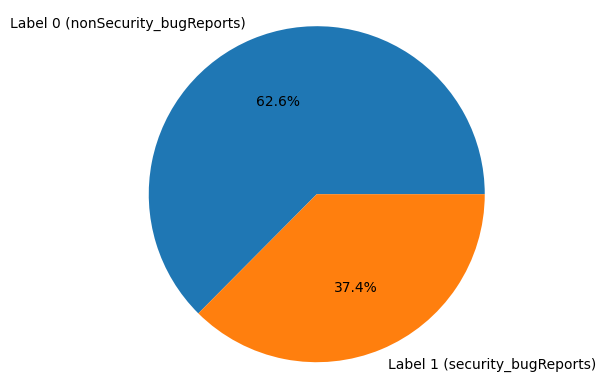

In [157]:
# SMOTE to deal with the class imbalance
smote = SMOTE(sampling_strategy=0.6)
X_train_smote, y_train_smote = smote.fit_resample(X_train_tfidf, y_train.values)
print(X_train_smote.shape, y_train_smote.shape)

# SMOTE on full training data
smote = SMOTE()
X_smote, y_smote = smote.fit_resample(X_tfidf, y.values)
print(X_smote.shape, y_smote.shape)

# Class Imbalance Check
plt.pie(pd.value_counts(y_train_smote),
        labels=['Label 0 (nonSecurity_bugReports)', 'Label 1 (security_bugReports)'],
        autopct='%0.1f%%')
plt.axis('equal')
plt.show()

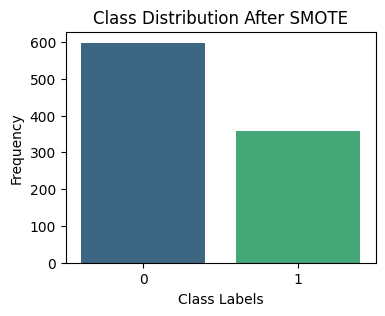

In [158]:
# Class Imbalance Check using bar plot
class_counts = pd.value_counts(y_train_smote)

plt.figure(figsize=(4, 3))
sns.barplot(x=class_counts.index, y=class_counts.values, palette='viridis')
plt.title('Class Distribution After SMOTE')
plt.xlabel('Class Labels')
plt.ylabel('Frequency')
plt.xticks(ticks=[0, 1], labels=['0', '1'])
plt.savefig('imb_mege.png', bbox_inches='tight')
plt.show()

In [159]:
# Functions to print scores
def training_scores(y_act, y_pred):
    acc = round(accuracy_score(y_act, y_pred), 3)
    f1 = round(f1_score(y_act, y_pred), 3)
    precision = round(precision_score(y_act, y_pred), 3)
    recall = round(recall_score(y_act, y_pred), 3)
    roc_auc = round(roc_auc_score(y_act, y_pred), 3)
    print(f'Training Scores: Accuracy={acc}, precision={precision}, recall={recall}, F1-Score={f1}, roc={roc_auc}')

def validation_scores(y_act, y_pred):
    acc = round(accuracy_score(y_act, y_pred), 3)
    f1 = round(f1_score(y_act, y_pred), 3)
    precision = round(precision_score(y_act, y_pred), 3)
    recall = round(recall_score(y_act, y_pred), 3)
    roc_auc = round(roc_auc_score(y_act, y_pred), 3)
    print(f'Validation Scores: Accuracy={acc}, precision={precision}, recall={recall}, F1-Score={f1}, roc={roc_auc}')

In [160]:
# Logistic Regression
lr = LogisticRegression()
lr.fit(X_train_smote, y_train_smote)
y_train_pred = lr.predict(X_train_smote)
y_test_pred = lr.predict(X_test_tfidf)
training_scores(y_train_smote, y_train_pred)
validation_scores(y_test, y_test_pred)

Training Scores: Accuracy=0.986, precision=0.981, recall=0.983, F1-Score=0.982, roc=0.986
Validation Scores: Accuracy=0.975, precision=0.75, recall=0.5, F1-Score=0.6, roc=0.747


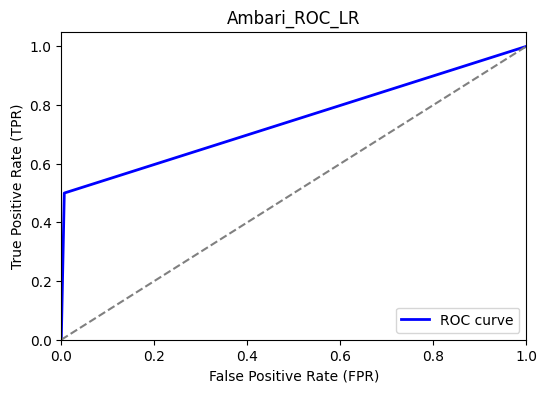

In [161]:
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve

# Compute ROC curve
fpr, tpr, thresholds = roc_curve(y_test, y_test_pred)

# Plot ROC curve
plt.figure(figsize=(6, 4))  # Set the figure size to be smaller
plt.plot(fpr, tpr, color='blue', lw=2, label='ROC curve')
plt.plot([0, 1], [0, 1], color='gray', linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate (FPR)')
plt.ylabel('True Positive Rate (TPR)')
plt.title('Ambari_ROC_LR')
plt.legend(loc='lower right')

# Save the plot with a smaller image size
plt.savefig('Ambari_ROC_LR_r.png', bbox_inches='tight')  # Adjust dpi for desired image size
plt.show()

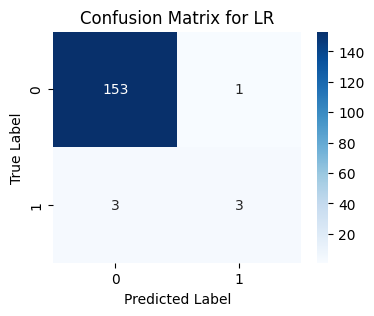

In [162]:
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import accuracy_score, precision_score, recall_score, roc_auc_score, roc_curve, confusion_matrix

# Calculate the confusion matrix
conf_matrix = confusion_matrix(y_test, y_test_pred)

# Plot the confusion matrix
plt.figure(figsize=(4, 3))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues')
plt.title('Confusion Matrix for LR')
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.savefig('confusion_matrix_lr_r.png', bbox_inches='tight')

plt.show()

---------------------**lime for Logistic Regression**---------------------

In [163]:
from lime.lime_text import LimeTextExplainer
class_names = list(train_df.label.unique())
explainer = LimeTextExplainer(class_names=class_names)

In [164]:
max_features = train_df.description.str.split().map(lambda x: len(x)).max()
print(max_features)

2710


In [165]:
from sklearn.pipeline import make_pipeline
pipe = make_pipeline(tfidf_vectorizer, lr)

In [166]:
import random

random.seed(21)
idx = random.randint(0, len(test))
print(idx)

exp = explainer.explain_instance(
    test.title.iloc[idx], pipe.predict_proba, num_features=5
)

42


In [167]:
print(
    f"Probability of sample to be non_security is: {pipe.predict_proba([test.title.iloc[idx]])}\n"
)
print(f"Explanation as a list of weighted features")
exp.as_list()

Probability of sample to be non_security is: [[0.83830248 0.16169752]]

Explanation as a list of weighted features


[('master', -0.015293530138418904),
 ('HBASE', 0.013281268092717707),
 ('fails', 0.010122462540559417),
 ('start', -0.010022578256097559),
 ('on', 9.171790305179324e-06)]

In [168]:
[test.title.iloc[idx]]

['HBASE fails to start on master']

In [169]:
exp.show_in_notebook(text=True)

In [170]:
# Naive Bayes Classifier
mnb = MultinomialNB()
mnb.fit(X_train_smote, y_train_smote)
y_train_pred = mnb.predict(X_train_smote)
y_test_pred = mnb.predict(X_test_tfidf)
training_scores(y_train_smote, y_train_pred)
validation_scores(y_test, y_test_pred)

Training Scores: Accuracy=0.992, precision=0.986, recall=0.992, F1-Score=0.989, roc=0.992
Validation Scores: Accuracy=0.938, precision=0.25, recall=0.333, F1-Score=0.286, roc=0.647


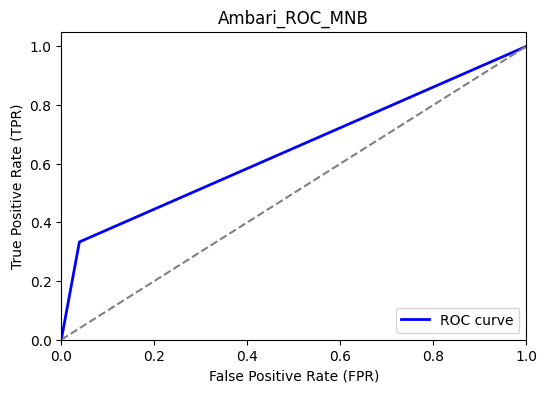

In [171]:
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve

# Compute ROC curve
fpr, tpr, thresholds = roc_curve(y_test, y_test_pred)

# Plot ROC curve
plt.figure(figsize=(6, 4))  # Set the figure size to be smaller
plt.plot(fpr, tpr, color='blue', lw=2, label='ROC curve')
plt.plot([0, 1], [0, 1], color='gray', linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate (FPR)')
plt.ylabel('True Positive Rate (TPR)')
plt.title('Ambari_ROC_MNB')
plt.legend(loc='lower right')

# Save the plot with a smaller image size
plt.savefig('Ambari_ROC_mnb_r.png', bbox_inches='tight')  # Adjust dpi for desired image size
plt.show()

----------------------------**lime for Naive Bayes**----------------------------

In [172]:
from sklearn.pipeline import make_pipeline
pipe = make_pipeline(tfidf_vectorizer, mnb)

In [173]:
import random

random.seed(21)
idx = random.randint(0, len(test))
print(idx)

exp = explainer.explain_instance(
    test.title.iloc[idx], pipe.predict_proba, num_features=5
)

42


In [174]:
print(
    f"Probability of sample to be non_security is: {pipe.predict_proba([test.title.iloc[idx]])}\n"
)
print(f"Explanation as a list of weighted features")
exp.as_list()

Probability of sample to be non_security is: [[0.7247509 0.2752491]]

Explanation as a list of weighted features


[('master', -0.12826123335236983),
 ('HBASE', 0.09024168790910354),
 ('start', -0.026689152048733893),
 ('fails', -0.010738352010546742),
 ('on', -0.0007055498353052565)]

In [175]:
[test.title.iloc[idx]]

['HBASE fails to start on master']

In [176]:
exp.show_in_notebook(text=True)

**============rf=========**

In [177]:
# Random Forest Classifier
rf = RandomForestClassifier()
rf.fit(X_train_smote, y_train_smote)
y_train_pred = rf.predict(X_train_smote)
y_test_pred = rf.predict(X_test_tfidf)
training_scores(y_train_smote, y_train_pred)
validation_scores(y_test, y_test_pred)

Training Scores: Accuracy=1.0, precision=1.0, recall=1.0, F1-Score=1.0, roc=1.0
Validation Scores: Accuracy=0.962, precision=0.0, recall=0.0, F1-Score=0.0, roc=0.5


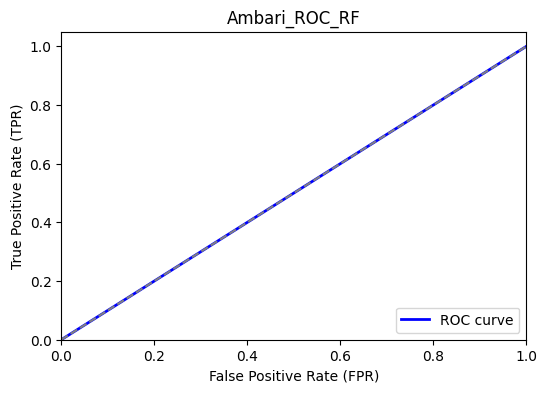

In [178]:
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve

# Compute ROC curve
fpr, tpr, thresholds = roc_curve(y_test, y_test_pred)

# Plot ROC curve
plt.figure(figsize=(6, 4))  # Set the figure size to be smaller
plt.plot(fpr, tpr, color='blue', lw=2, label='ROC curve')
plt.plot([0, 1], [0, 1], color='gray', linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate (FPR)')
plt.ylabel('True Positive Rate (TPR)')
plt.title('Ambari_ROC_RF')
plt.legend(loc='lower right')

# Save the plot with a smaller image size
plt.savefig('Ambari_ROC_RF_r.png', bbox_inches='tight')  # Adjust dpi for desired image size
plt.show()

----------------------**lime for Random Forest Classifier**---------------------

In [179]:
from sklearn.pipeline import make_pipeline
pipe = make_pipeline(tfidf_vectorizer, rf)

In [180]:
import random

random.seed(21)
idx = random.randint(0, len(test))
print(idx)

exp = explainer.explain_instance(
    test.title.iloc[idx], pipe.predict_proba, num_features=5
)

42


In [181]:
print(
    f"Probability of sample to be non_security is: {pipe.predict_proba([test.title.iloc[idx]])}\n"
)
print(f"Explanation as a list of weighted features")
exp.as_list()

Probability of sample to be non_security is: [[0.95 0.05]]

Explanation as a list of weighted features


[('master', 0.04995960956131046),
 ('HBASE', -0.009609924658661404),
 ('fails', -0.009198744774049679),
 ('start', 0.002706576039026246),
 ('to', -0.001184323553582509)]

In [182]:
[test.title.iloc[idx]]

['HBASE fails to start on master']

In [183]:
exp.show_in_notebook(text=True)

In [184]:
# Extreme Gradient Boosting Classifier
xgb = XGBClassifier(objective='binary:logistic', eval_metric='logloss')
xgb.fit(X_train_smote, y_train_smote)
y_train_pred = xgb.predict(X_train_smote)
y_test_pred = xgb.predict(X_test_tfidf)
training_scores(y_train_smote, y_train_pred)
validation_scores(y_test, y_test_pred)

Training Scores: Accuracy=0.998, precision=1.0, recall=0.994, F1-Score=0.997, roc=0.997
Validation Scores: Accuracy=0.956, precision=0.429, recall=0.5, F1-Score=0.462, roc=0.737


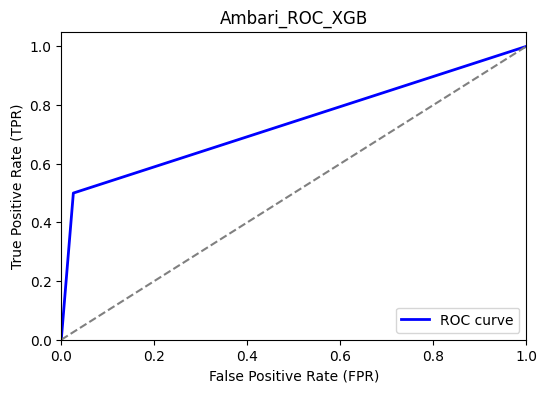

In [185]:
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve

# Compute ROC curve
fpr, tpr, thresholds = roc_curve(y_test, y_test_pred)

# Plot ROC curve
plt.figure(figsize=(6, 4))  # Set the figure size to be smaller
plt.plot(fpr, tpr, color='blue', lw=2, label='ROC curve')
plt.plot([0, 1], [0, 1], color='gray', linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate (FPR)')
plt.ylabel('True Positive Rate (TPR)')
plt.title('Ambari_ROC_XGB')
plt.legend(loc='lower right')

# Save the plot with a smaller image size
plt.savefig('Ambari_ROC_XGB_r.png', bbox_inches='tight')  # Adjust dpi for desired image size
plt.show()

---------------------**lime for Extreme Gradient Boosting**---------------------

In [186]:
from sklearn.pipeline import make_pipeline
pipe = make_pipeline(tfidf_vectorizer, xgb)

In [187]:
import random

random.seed(21)
idx = random.randint(0, len(test))
print(idx)

exp = explainer.explain_instance(
    test.title.iloc[idx], pipe.predict_proba, num_features=5
)

42


In [188]:
print(
    f"Probability of sample to be non_security is: {pipe.predict_proba([test.title.iloc[idx]])}\n"
)
print(f"Explanation as a list of weighted features")
exp.as_list()

Probability of sample to be non_security is: [[0.99736357 0.00263645]]

Explanation as a list of weighted features


[('start', -0.005619736681306799),
 ('fails', -0.00038235631676542323),
 ('to', -1.4897151210665886e-05),
 ('master', -1.3916025045125245e-05),
 ('on', -1.0054212515115952e-05)]

In [189]:
[test.title.iloc[idx]]

['HBASE fails to start on master']

In [190]:
exp.show_in_notebook(text=True)